In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Objective function to minimize 

def objective_function(x, function_name):
    if function_name == 'sphere':
        return sphere_function(x)
    elif function_name == 'rosenbrock':
        return rosenbrock_function(x)
    elif function_name == 'ackley':
        return ackley_function(x)
    else:
        raise ValueError("Unknown function name")

def sphere_function(x):
    return np.sum(x**2) 

def rosenbrock_function(x):
    return sum(100.0 * (x[1:] - x[:-1]**2.0)**2.0 + (1 - x[:-1])**2.0)

def ackley_function(x):
    first_sum = np.sum(x**2)
    second_sum = np.sum(np.cos(2 * np.pi * x))
    n = len(x)
    return -20 * np.exp(-0.2 * np.sqrt(first_sum / n)) - np.exp(second_sum / n) + 20 + np.e

In [12]:
objective_function_name = 'sphere' # Choose the objective function to minimize

# Parameter settings for a Particle Swarm Optimization (PSO) algorithm
global num_particles, max_iterations, c1, c2, w_inertia, particles, velocities
global personal_best_positions, personal_best_costs, global_best_position, global_best_cost

bounds = np.array([[-10, -10, -10], [10, 10, 10]]) # Search space boundaries for each dimension

num_particles = 30
max_iterations = 100
c1, c2 = 0.5, 1.5 # Cognitive and social coefficients
w_inertia = 0.9 # Inertia weight to balance exploration and exploitation

particles = np.random.uniform(bounds[0], bounds[1], (num_particles, 3)) # Initial positions of particles
velocities = np.random.uniform(-1, 1, (num_particles, 3)) # Initial velocities of particles

# Initialize personal best positions and costs
personal_best_positions = np.copy(particles)
personal_best_costs = np.array([objective_function(p, objective_function_name) for p in particles])

# Initialize global best position and cost
global_best_position = particles[0].copy()
global_best_cost = personal_best_costs[0]

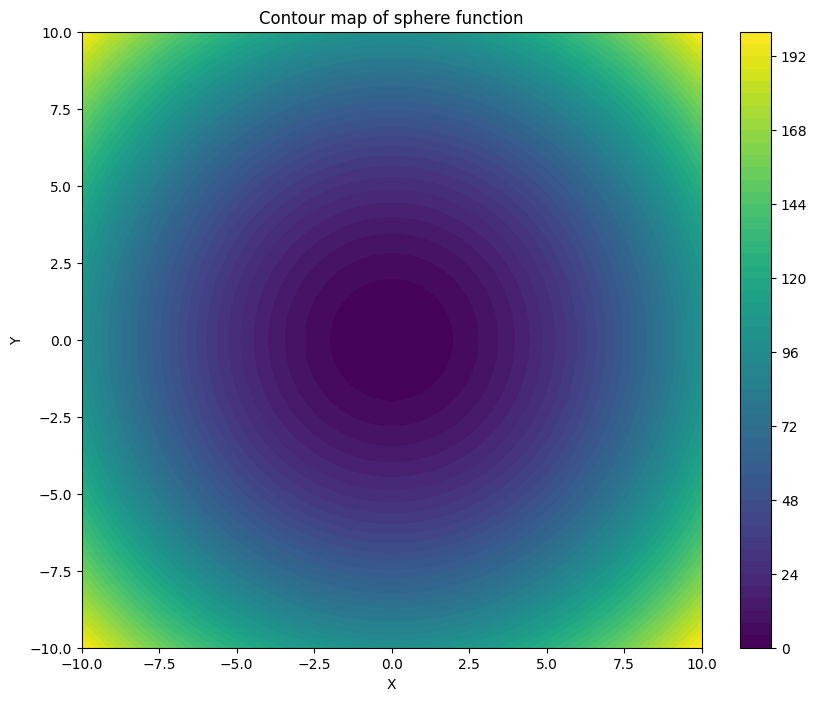

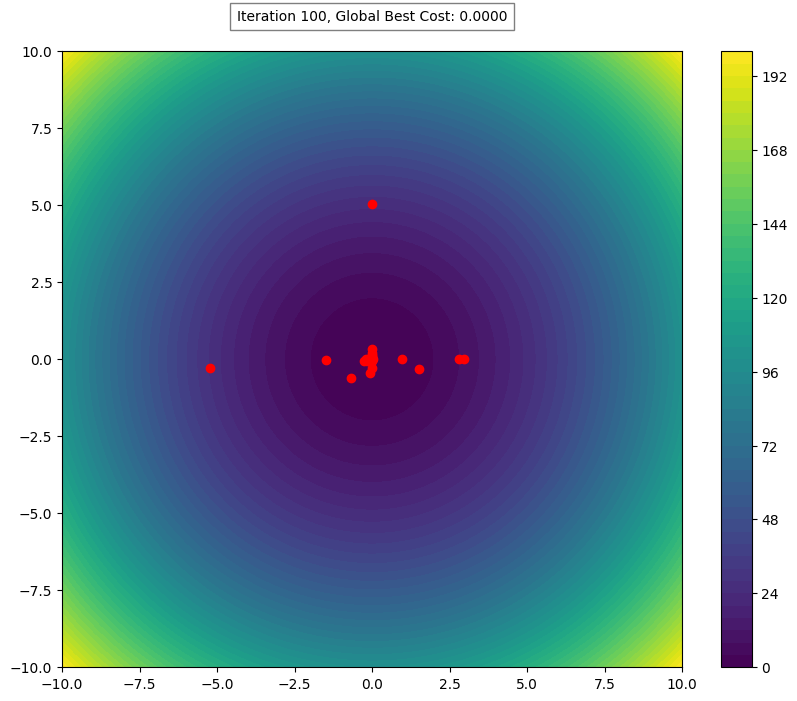

In [14]:
# Perform the optimization loop


# Compute and plot the function in 3D within [0,5]x[0,5]
x = np.linspace(-10, 10, 100)
y = np.linspace(-10, 10, 100)
X, Y = np.meshgrid(x, y)
Z = np.array([[objective_function(np.array([i, j, 0]), objective_function_name) for i in x] for j in y])

# Set up base figure: The contour map
plt.figure(figsize=(10, 8))
contour = plt.contourf(X, Y, Z, levels=50, cmap='viridis')
plt.colorbar(contour)
plt.title(f"Contour map of {objective_function_name} function")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

def animate_pso(): 
    fig, ax = plt.subplots(figsize=(10, 8))
    contour = ax.contourf(X, Y, Z, levels=50, cmap='viridis')
    plt.colorbar(contour)
    scat = ax.scatter(particles[:, 0], particles[:, 1], c='red')
    title = ax.text(0.5, 1.05, "", bbox={'facecolor':'w', 'alpha':0.5, 'pad':5},
                    transform=ax.transAxes, ha="center")

    def pso_optimization(frame):
        global global_best_cost, global_best_position
        
        # Random matrix used to compute the cognitive and social components of the velocity update
        r1, r2 = np.random.rand(num_particles, 3), np.random.rand(num_particles, 3)

        cognitive_component = c1 * r1 * (personal_best_positions - particles)
        social_component = c2 * r2 * (global_best_position - particles)

        velocities[:] = (w_inertia * velocities) + cognitive_component + social_component
        particles[:] += velocities

        # Ensure particles stay within bounds
        particles[:] = np.clip(particles, bounds[0], bounds[1])

        # Evaluate the objective function for all particles
        costs = np.array([objective_function(p, objective_function_name) for p in particles])

        # Update personal bests with numPy boolean indexing
        is_best = costs < personal_best_costs
        personal_best_positions[is_best] = particles[is_best]
        personal_best_costs[is_best] = costs[is_best]

        # Update global best with numPy boolean indexing
        global_best_index = np.argmin(personal_best_costs)
        if personal_best_costs[global_best_index] < global_best_cost:
            global_best_cost = personal_best_costs[global_best_index]
            global_best_position = personal_best_positions[global_best_index].copy()

        scat.set_offsets(particles[:, :2]) # Update scatter plot with new particle positions, only x and y
        title.set_text(f"Iteration {frame+1}, Global Best Cost: {global_best_cost:.4f}")
        return scat, title

    animation = FuncAnimation(fig, pso_optimization, frames=max_iterations, blit=True, repeat=False)
    
    #animation.save("PSO.gif", dpi=80, writer="pillow")

    return HTML(animation.to_jshtml())

animate_pso()
